# Individual Crypto Predictions

- Tim Braams (8460701)
- Vinh Phan (8462380)
- Maximilian Pintilie (8462780)
- Rahul Singh (8464147)
- Kartik Vijay (8463465)
- Diego Zucchino (8345420)

----
# Imports

In [2]:
import os
import json
import pandas as pd 
import numpy as np
import datetime
from dateutil import parser
import joblib 
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
import scripts.utils as ut
import warnings
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)
pd.set_option("display.precision", 16)

/srv/scratch/dl/submission/scripts/utils.py:9: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime
/srv/scratch/dl/submission/scripts/utils.py:13: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [3]:
import torch
from pytorch_lightning.callbacks import EarlyStopping
from darts import TimeSeries
from darts.metrics import mse, mae, rmse, r2_score, mape
from darts.models import LinearRegressionModel
from darts.models import RandomForest
from darts.models import LightGBMModel
from darts.models import TCNModel

In [4]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots
from plotly.subplots import make_subplots
import seaborn as sns

----
# Helper Functions

In [ ]:
def read_repair(name):
    
    """
    Purpose: The predictions and realizations for each model are saved in separate json files. Some of the columns contain values saved as sting list. In orther to retrive the values 
    the function converts the sring data into a list with the calculated values. In addition in inserts a new column with the to identify the model to which the values belongs to. In case of 
    concatanation with the other 
    
    Parameters:
         name: Name of the crypto file
         
    Return: returns a the dataframe for the given crypto results file. 
    """
    

    df = pd.read_json("results/final_scores/"+name+"_results.json")
    df.insert(0,"model", name.upper())
    df.loc[:,'test_predictions'] = df["test_predictions"].apply(json.loads)
    df.loc[:,'test_actual_returns']= df["test_actual_returns"].apply(json.loads)
    df.loc[:,'validation_predictions']= df["validation_predictions"].apply(json.loads)
    df.loc[:,'validation_actual_returns']= df["validation_actual_returns"].apply(json.loads)
    
    return df

def get_scores(df, model):
    
    final_df = pd.DataFrame()
    final_table = df[df["model"] == model]
    final_df.insert(0, "mse_"+model, df.groupby("crypto").mean()["mse"])
    final_df.insert(0, "mae_"+model, df.groupby("crypto").mean()["mae"])
    final_df.reset_index(inplace = True)
    
    return final_df
    
def get_time_index(df, crypto):
    
    start = df["total_time_series"][crypto][2:21]
    end = df["total_time_series"][crypto][-21:-2]
    list_ = list(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq='H'))

    return list_

master_table_returns = pd.read_csv("data/master_returns_df.csv") # Master table includes the aggregation of all cryptos whose data has been resampled hourly. The returns column is present.  
crypto_list = list(master_table_returns.crypto.unique()) # Python list containg the names of the cryptos in the master_table_returns dataframe. 

----
# Correlation between cryptos 

During our exploratory data analysis we decided to investigate the correlation among the 10 cryptocurrencies. We believe that by pooling the data we will lose information and variance in the data. Therefore, the Pearson correlation coefficient was calculated on the returns during the training window. 

Results: 

1. All cryptocurrencies are positively highly correlated, 
2. The highest positive correlation is between LTC and BTC with 0.70. 
3. The lowest postive correlation is between TRX and ETH with 0.26
4. LTC has a strong correlation with most cryptos.

Initial Assumptions:

Despite the strong correlation between the cryptocurrencies, we decided to proceed with individual modelling because the volatility of the cryptos may be different. Thus, certain models may prove better at predicting returns for certain cryptos because the model is able to capture the crypto's volatility better than another model. Thus, by having individual models for individual cryptos, we are able to determine which model is best for each crypto. In the end, we can have a custom model/solution for each coin that minimizes the MSE/MAE of a crypto's return.

In [13]:
def get_train_returns(master_table, crypto): 
    
    df = master_table[master_table["crypto"] == crypto][["open_time","crypto", "returns"]]
    df['open_time'] = pd.to_datetime(df.open_time)
    test_start = pd.Timestamp(df["open_time"].iloc[-1]) - pd.Timedelta(365, "days")
    common_training_start =  test_start - pd.Timedelta(730, "days")
    df_training_returns = df[(pd.to_datetime(df["open_time"]) > common_training_start) & (pd.to_datetime(df["open_time"]) < pd.to_datetime(test_start))]

    return df_training_returns[["open_time","crypto","returns"]]


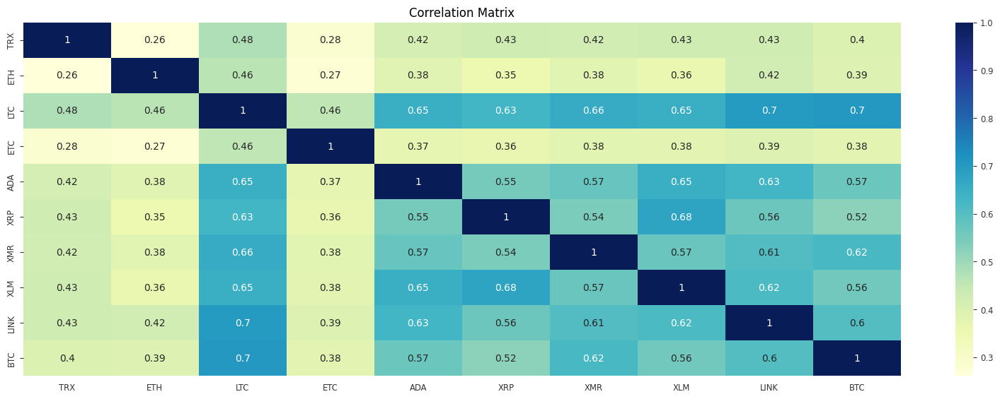

In [15]:
corr_df = pd.DataFrame()

for i in crypto_list:
    corr_df[i] = list(get_train_returns(master_table_returns, i)["returns"])

correlation_matrix = corr_df.corr()
plt.figure(figsize=(20,6.5))
plt.rcParams.update({'font.size': 10})
plt.title("Correlation Matrix")
ax = sns.heatmap(correlation_matrix, annot=True, cmap="YlGnBu")

----
# Histograms for Cryptos

The next analysis during the individual crypto prediction was checking the distribution of the returns for each crypto during the training timeframe. The x-axis indicates standard deviations and the y-axis indicates probabiliy for a given return.

Observations:
1. All of the cryptos have returns centered around 0 and range from -0.1 to 0.5. The distributions for each crypto appear to be Gaussian despite many having a steep peak in the middle. One reason that the returns are centered around 0 may be due to the fact that we are using hourly data. Therefore, changes may not fluctuate so drastically from hour to hour as it would from day to day, month to month, etc. 
2. LINK's returns are more spread which indicates more volatility. In contrast, TRX's distribution for returns appears very tightly clustered.

In [16]:
def get_training_df(master_table, crypto): 
    
    df = master_table[master_table["crypto"] == crypto][["open_time","crypto", "returns"]]
    df['open_time'] = pd.to_datetime(df.open_time)
    test_start = pd.Timestamp(df["open_time"].iloc[-1]) - pd.Timedelta(365, "days")
    df_training_returns = df[pd.to_datetime(df["open_time"]) < test_start]

    return df_training_returns[["open_time","crypto","returns"]]


def create_histogram_returns(master_table, crypto): 
    
    df = get_training_df(master_table_returns, crypto)
    crypto_plot = go.Histogram(x= df.returns, autobinx=False,
                               name = crypto, 
                               histnorm='probability',
                               xbins=dict(
                                   start = df.returns.min(),
                                   end=0.5,)
                              )
    return crypto_plot

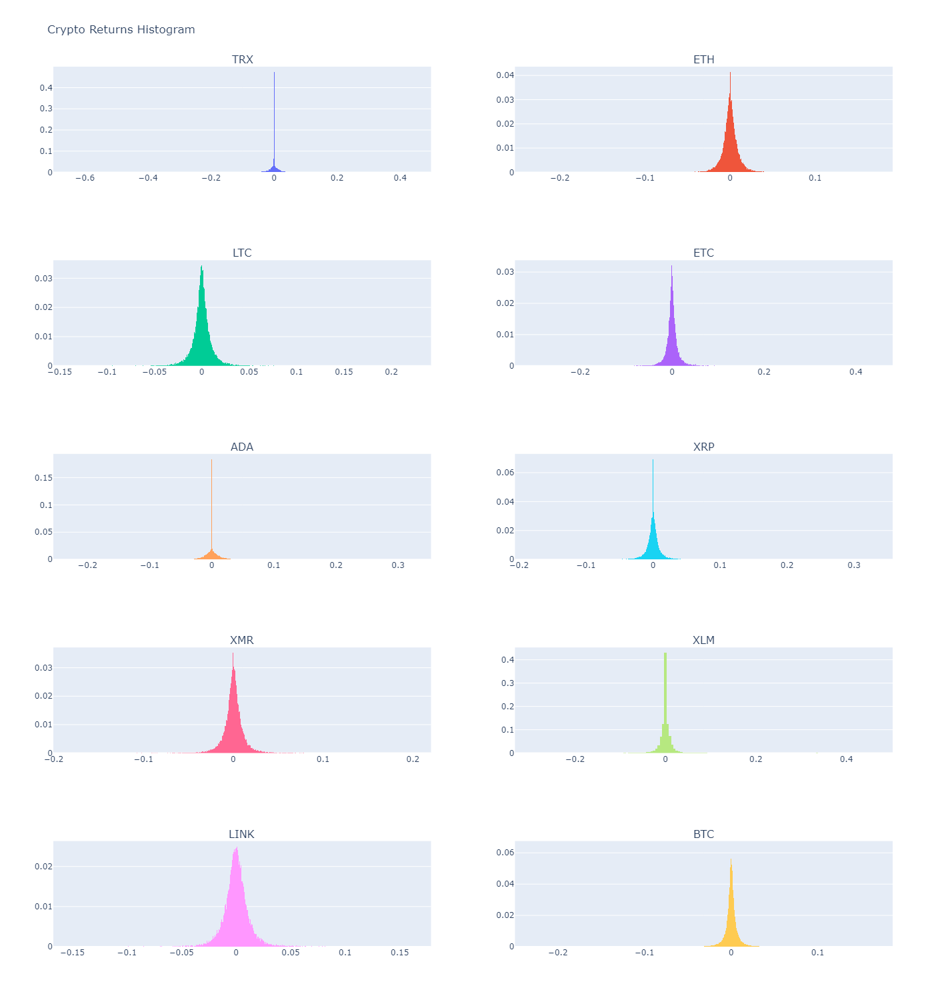

In [18]:
fig = make_subplots(rows = 5 , cols = 2, subplot_titles=['TRX', 'ETH', 'LTC', 'ETC', 'ADA', 'XRP', 'XMR', 'XLM', 'LINK','BTC'])
j = 0 

for i in np.arange(1,6): 
    for x in np.arange(1,3): 
        
        fig.append_trace(create_histogram_returns(master_table_returns, crypto_list[j]), i, x)
        j += 1

fig.update_layout(barmode='stack')
fig.update_layout(height=1500, width=1000, title_text="Crypto Returns Histogram", showlegend = False)
fig.show()

----
# Modelling 

## Crypto Minute Data: Data Set-Up and Modelling Process

### Data Set-Up

For all of our Darts models, we stick with the resampled hourly crypto data from the minute data. Since the Darts library requires time series data, using the resampled crypto minute data ensures that we have equidistant time series data for each crypto. For each crypto, we will have 3 data sets: training, validation, and test. 

We split the data for each crypto as follows:

We take the test set as the full length of the final year. The remaining data is then partitioned as the training set. To create our validation set, we set aside the full length last year from the training set.

### Modelling Process
The 4 models which we would like to test are Linear Regression, Random Forest, LightGBM, and Temporal Convolutional Network. The rationale behind choosing these models will be explained in detail in the next section. We will apply each model individually to the cryptos that we have. For example, we will have 10 different linear regression models corresponding to each of our 10 cryptos.

In [39]:
master_table = pd.read_csv("data/master_returns_df.csv")
crypto_list = list(master_table.crypto.unique()) 

## DartsCryptoPrediction Class

In [92]:
class DartsCryptoPrediction: 
    '''
    This class manages all the Darts models which we will use for time series prediction.
    
    We first have a method called convert_to_darts which converts our resampled crypto minute data
    from JSON to a special data type called TimeSeries that Darts uses. This method splits up a single crypto's
    data into a traning, validation, and test set.
    
    Our modeling methods within this class are below:
    
    lr_modelling
    rf_modelling
    lgbm_modelling
    tcn_modelling
    
    These methods are all very similar in that they instantiate a model, train it, and fit it. The
    fitting of the model is a special function in Darts called historical_forecasts. historical_forecasts
    is a prediction method which uses a shifting method and has the following parameters:
    
    series = full time series of the data
    start = time stamp indicating when you want to begin predictions
    forecast_horizon = the number of predictions you want to make for every iteration the shifting window
    stride = number of time steps you would like to move after each prediction
    retrain = whether or not you want to retrain your data after each window movement (SET TO FALSE FOR ALL MODELS)
    overlap_end = if your stride and forecast_horizon are uneven, set this to True
    last_points_only = if overlap end is true, take last prediction instead of averaged overlap
    verbose = indicates whether you want messages to appear when running the model
    
    The last method we have is called get_metrics. This aggregates our results from a model into 
    a pandas dataframe. 
    '''
    
    def __init__(self, crypto_name):
        '''
        Initialize DartsCryptoPrediction class.
        
        :param crypto_name: Name of crypto which you wish to perform modelling on
                                    
        :return: None            
        ''' 
        self.crypto_name = crypto_name

    def convert_to_darts(self): 
        '''
        Splits crypto minute data in training, validation, test set.
        
        :return: full time series, training time series, validation time series,
                 and test time series for a crypto in Darts' Timeseries format
        '''
        train, test = ut.get_train_test(self.crypto_name)
        train.insert(0,"open_time", train.index)
        train.sort_values(by = "open_time", ascending = True, inplace = True)
        train.reset_index(inplace = True)
        test.insert(0,"open_time", test.index)
        test.sort_values(by = "open_time", ascending = True, inplace = True)
        test.reset_index(inplace = True)
        validation = train[round(-0.1*len(train)):]
        train_time_series = TimeSeries.from_dataframe(train, "open_time", "returns")
        test_time_series = TimeSeries.from_dataframe(test, "open_time", "returns")
        val_time_series = TimeSeries.from_dataframe(validation, "open_time", "returns")
        total_time_series = train_time_series.append(test_time_series)
        return train_time_series, test_time_series, total_time_series, val_time_series
    
    def lr_modelling(self, train_time_series, test_time_series, total_time_series, val_time_series):
        from darts.models import LinearRegressionModel

        # Model Instantiation
        model = LinearRegressionModel(lags = 6)
        # Training of the model
        model.fit(train_time_series)
        # Predicting
        pred = model.historical_forecasts(series = total_time_series,
                                          start = test_time_series.pd_dataframe().index[0],
                                          forecast_horizon = 1,
                                          stride = 1, 
                                          retrain = False, 
                                          verbose = False)

        val_pred = model.historical_forecasts(series = train_time_series, 
                                              forecast_horizon = 1, 
                                              start = val_time_series.pd_dataframe().index[0],
                                              stride = 1, 
                                              retrain = False, 
                                              verbose = False)


        return pred, val_pred
        
    def rf_modelling(self, train_time_series, test_time_series, total_time_series, val_time_series): 
        from darts.models import RandomForest

        # Model Instantiation     
        model = RandomForest(lags = 24,
                             output_chunk_length = 1, 
                             random_state = 42, 
                             n_estimators = 500, 
                             n_jobs = -1)
        # Training of the model
        print("Training just started")
        model.fit(series = train_time_series)
        # Predicting
        print("testing just started")
        pred = model.historical_forecasts(series = total_time_series, 
                                          train_length = len(train_time_series), 
                                          start = test_time_series.pd_dataframe().index[0], 
                                          forecast_horizon = 1, 
                                          stride = 1, 
                                          retrain = False, 
                                          overlap_end = False, 
                                          last_points_only = True,
                                          verbose = False)
            
        val_pred = model.historical_forecasts(series = train_time_series, 
                                              forecast_horizon = 1, 
                                              start = val_time_series.pd_dataframe().index[0],
                                              stride = 1, 
                                              retrain = False,
                                              overlap_end = False, 
                                              last_points_only = True,
                                              verbose = False)

            return pred, val_pred
        
    def lgbm_modelling(self, train_time_series, test_time_series, total_time_series, val_time_series):
        from darts.models import LightGBMModel
        # Model Instantiation
        model = LightGBMModel(lags = 24,
                              output_chunk_length = 1,
                              objective = 'regression',
                              n_jobs = -1)
        # Training of the model
        model.fit(train_time_series)
        # Predicting
        pred = model.historical_forecasts(series = total_time_series,
                                          start = test_time_series.pd_dataframe().index[0],
                                          forecast_horizon = 1,
                                          stride = 1, 
                                          retrain = False, 
                                          verbose = False)
        
        val_pred = model.historical_forecasts(series = train_time_series, 
                                              forecast_horizon = 1, 
                                              start = val_time_series.pd_dataframe().index[0],
                                              stride = 1, 
                                              retrain = False, 
                                              verbose = False)
        
        return pred, val_pred
                
    def tcn_modelling(self, train_time_series, test_time_series, total_time_series, val_time_series): 
        from darts.models import TCNModel
        
        my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=5,
        mode='min')

        my_model = TCNModel(
            input_chunk_length= 349,
            batch_size = 118,
            optimizer_cls = torch.optim.Adam,
            output_chunk_length=1,
            n_epochs=100,
            dropout=0.48,
            dilation_base=2,
            weight_norm=False,
            kernel_size=4,
            num_filters=13,
            nr_epochs_val_period=1,
            random_state=0,
            save_checkpoints=True,
            pl_trainer_kwargs={"callbacks": [my_stopper]}
        )

        # Training of the model
        my_model.fit(series=train_time_series, val_series=val_time_series, verbose=True)
        # Predicting
        #print("prediction just started")
        pred = my_model.historical_forecasts(series = total_time_series, 
                                             train_length = len(train_time_series), 
                                             start = test_time_series.pd_dataframe().index[0], 
                                             forecast_horizon = 1, 
                                             stride = 1, 
                                             retrain = False, 
                                             overlap_end = False, 
                                             last_points_only = True,
                                             verbose = True)

        val_pred = my_model.historical_forecasts(series = train_time_series, 
                                                 forecast_horizon = 1, 
                                                 start = val_time_series.pd_dataframe().index[0],
                                                 stride = 1, 
                                                 retrain = False, 
                                                 overlap_end = False, 
                                                 last_points_only = True,
                                                 verbose = False)

        return pred, val_pred

    def get_metrics(self, test_time_series, pred, total_time_series, val_pred, val_time_series):
        '''
        Calculates MSE/MAE and aggregates results and data from a model.
        
        :param test_time_series: Darts' Timeseries of test data
        :param pred: Darts' Timeseries of test prediction data
        :param total_time_series: Darts' Timeseries of total data
        :param val_pred: Darts' Timeseries of validation prediction data
        :param val_time_series: Darts' Timeseries of validation data
        
        :return: A pandas dataframe which has crypto name, test mse, test mae,
                 val mse, val mae, test_predictions, test_actual_returns,
                 validation_predictions, validation_actual_returns,
                 and total_time_series.
        '''
        from darts.metrics import mse
        from darts.metrics import mae

        # calculating scores 
        mse_ = mse(test_time_series, pred, n_jobs = -1)
        mae_ = mae(test_time_series, pred, n_jobs = -1)
        mse_val = mse(val_time_series, val_pred)
        mae_val = mae(val_time_series,val_pred)

        # Converting time series darts to dataframes 
        total_time_series_df = total_time_series.pd_dataframe()
        total_time_series_df.insert(0, "open_time_", pd.to_datetime(total_time_series_df.index))
        pred_df = pred.pd_dataframe()
        pred_df.reset_index(inplace = True)
        val_df = val_pred.pd_dataframe()
        val_df.reset_index(inplace = True) 
        test_time_df = test_time_series.pd_dataframe()
        actual_validation = val_time_series.pd_dataframe()

        # appending results 
        results_df = pd.DataFrame({"crypto":self.crypto_name, 
                                   "mse": mse_,
                                   "mae": mae_,
                                   "mse_val" : mse_val,
                                   "mae_val": mae_val,
                                   "test_predictions": str(pred_df['returns'].to_list()), 
                                   "test_actual_returns": str(test_time_df['returns'].to_list()),
                                   "validation_predictions": str(val_df['returns'].to_list()),
                                   "validation_actual_returns": str(val_df['returns'].to_list()),
                                   "total_time_series":str(list(total_time_series_df.open_time_.astype(str)))
                                   },index=[0])
        return results_df 

## Crypto Predictions

In [89]:
crypto_list = ['TRX', 'ETH', 'LTC', 'ETC', 'ADA', 'XRP', 'XMR', 'XLM', 'LINK', 'BTC']

In [ ]:
# Linear Regression Model, DartsCryptoPrediction.lr_modelling
# Use DartsCryptoPrediction and model each crypto using linear regression.
df = pd.DataFrame()

for i in tqdm(crypto_list): 
    tf = DartsCryptoPrediction(i)
    train_time_series, test_time_series, total_time_series, val_time_series = tf.convert_to_darts()
    pred, val = tf.lr_modelling(train_time_series,test_time_series,total_time_series, val_time_series)  # change here
    results = tf.get_metrics(test_time_series, pred, total_time_series, val, val_time_series)
    df = df.append(results)  
    
df.reset_index(inplace = True)
df.drop(columns= ["index"], inplace = True)
df.to_json("results/final_scores/linear_regression_results.json") # change here

In [ ]:
# Random Forest Model, DartsCryptoPrediction.rf_modelling
# Use DartsCryptoPrediction and model each crypto using random forest.
df = pd.DataFrame()

for i in tqdm(crypto_list): 
    tf = DartsCryptoPrediction(i)
    train_time_series, test_time_series, total_time_series, val_time_series = tf.convert_to_darts()
    pred, val = tf.rf_modelling(train_time_series,test_time_series,total_time_series, val_time_series)  # change here
    results = tf.get_metrics(test_time_series, pred, total_time_series, val, val_time_series)
    df = df.append(results)  

df.reset_index(inplace = True)
df.drop(columns= ["index"], inplace = True)
df.to_json("results/final_scores/rf_regression_results.json") # change here

In [93]:
# LightGBM Model, DartsCryptoPrediction.lgbm_modelling
# Use DartsCryptoPrediction and model each crypto using LightGBM.
df = pd.DataFrame()

for i in tqdm(crypto_list): 
    tf = DartsCryptoPrediction(i)
    train_time_series, test_time_series, total_time_series, val_time_series = tf.convert_to_darts()
    pred, val = tf.lgbm_modelling(train_time_series,test_time_series,total_time_series, val_time_series)  # change here
    results = tf.get_metrics(test_time_series, pred, total_time_series, val, val_time_series)
    df = df.append(results)  

df.reset_index(inplace = True)
df.drop(columns= ["index"], inplace = True)
df.to_json("results/final_scores/lightgbm_regression_results.json") # change here

100%|██████████| 10/10 [52:50<00:00, 317.01s/it] 


In [ ]:
# TCN Model, DartsCryptoPrediction.tcn_modelling
# Use DartsCryptoPrediction and model each crypto using Temporal Convolutional Network.

# Since the TCN model was very computationally expensive, we ran this the TCN model
# on Google Colab. We have provided here what the code would look like to run the TCN model.
df = pd.DataFrame()

for i in tqdm(crypto_list): 
    tf = DartsCryptoPrediction(i)
    train_time_series, test_time_series, total_time_series, val_time_series = tf.convert_to_darts()
    pred, val = tf.tcn_modelling(train_time_series,test_time_series,total_time_series, val_time_series)  # change here
    results = tf.get_metrics(test_time_series, pred, total_time_series, val, val_time_series)
    df = df.append(results)  
    
df.reset_index(inplace = True)
df.drop(columns= ["index"], inplace = True)
df.to_json("results/final_scores/cnn_results.json") # change here

## Model Choice Explanation

### Linear Regression

Our first approach was to employ a simple linear regression model. We wanted linear regression to serve as a baseline for other models. Linear regression's ease of use, interpretability, and speed made it a good first model use on our data. For our linear regression model, our dependent variable is a single future return in our time series. Our regressors are 6 past lags. A lag is defined as a return from the previous hour. Since we have 6 lags, our regressors our returns from the 6 previous hours. An important assumption we make is that the lags we use has a linear relationship with the future hour's return price that we are trying to predict. 

### Random Forest

Our second approach was to use a random forest model. We wanted to see if a more complex model would yield better results. The random forest model is similar to the linear regression model in that we need to feed the number of lags in order for the decision trees in the forest to make splits and to make our prediction of returns. One drawback of using a random forest is that each observation in the time series is treated independently within the model. Thus, it will be difficult for the random forest to determine trends or seasonality over a long period of time since it is not feasible to have years worth of lagged data as features for the random forest.

### LightGBM

Our third approach was to use a Light Gradient Boosting Machine. This is a natural continuation of random forests. Gradient boosting machines (GBMs) are very similar to random forests in that they both are ensemble learning methods. However, GBMs differ from random forests because it attempts to build a strong classifier from weak classifiers. In a GBM, decision trees are built sequentially. Weights are assigned to the independent variables, our lagged data, and then fed into a decision tree in order to get a prediction for returns. The weights for variables that are predicted incorrectly by the tree is then increased and these variables are subsequently fed into a second decision tree. This process continues for however many trees that are specified in the model. These individual trees form an ensemble to provide a strong regression model. Figure 1 below provides a simple visualization of the gradient boosting process.

<p align = 'center'>
  <img src = 'https://iq.opengenus.org/content/images/2020/01/0_KYszvMnr3nCtjaGy.png' width = '800'/>
  <center><em> Figure 1 </em></center>
</p>

### Temporal Convolutional Network (TCN)

Our fourth approach was to use a Temporal Convolutional Network (TCN). The realm of sequence modeling within deep learning has been largely associated with recurrent neural network architectures such as LSTMs. However, when RNN’s are unrolled, they are extremely deep and have many hidden layers. Since the weights in an RNN model are trained using backpropagation, when the gradient is passed through many hidden layers, it can grow to an extremely large value or vanish altogether. Because of this issue, we investigated the possibility of using a convolutional network to predict our time series sequence. A recent paper titled “An Empirical Evaluation of Generic Convolutional and Recurrent Networks for Sequence Modeling” by Shaojie Bai et al. has delivered promising results on sequence predictions using an architecture they term as a “Temporal Convolutional Network” or TCN. The architecture of the TCN is able to take an input sequence of any length and map it to an output sequence of the same length, just like how an RNN can.

One convolutional layer of a TCN consists of a 1-D input layer, a 1-D kernel, and a 1-D output layer. The convolution works as follows: A kernel size is first initialized. The length of the kernel must equal the length of the kernel size because the dot product will be computed from these values. For the output layer to be of the same length as the input layer, zero padding may be performed at the beginning or at the end of the input layer. Figure 2 below provides a visualization for this process.

<p align = 'center'>
  <img src = 'https://miro.medium.com/max/1400/1*holhbUNBM6mofMb-Y0lL2A.png' width = '600'/>
  <center><em> Figure 2 </em></center>
</p>

Additionally, it is very desirable for forecasting models to have an output/prediction to depend on all previous entries in the input. TCN’s are able to implement this feature by utilizing what’s known as a receptive field. The receptive field is the set of entries of the original input that affect a specific entry of the output. The receptive field of a TCN model can be the entire length of the input layer. This makes it so that a single output takes into consideration the entire sequence length. However, one disadvantage of having a receptive field this wide is that a large number of convolutional layers will be needed. To resolve this issue, TCN’s have a parameter called dilation. Dilation is a parameter within the convolutional layers that determines how many elements should be skipped when applying the kernel to the input layer. The dilation value generally increases exponentially with each convolutional layer that is added. By using dilation, the TCN is able to have an extremely wide receptive field while also having few hidden layers. This makes the overall TCN model less computationally intensive to fit on a set of training data. This architecture is what defines the basic structure of a TCN. Figure 3 below provides a visualization for this process.

<p align = 'center'>
  <img src = 'https://lukeguerdan.com/assets/img/TCNfigureB.png' width = '600'/>
  <center><em> Figure 3 </em></center>
</p>

### Summary

Our first three models considers each observation as independent during fitting. This is a drawback because observations within time series data can be correlated. We wanted our 4th model to be able to consider a wide range of observations when fitting the model on training data. In addition, all 4 of our above mentioned Darts models require sequential data. In contrast, the pooled data has multiple identical open times due to combining all the cryptos together. Finally, we compared the performance (MSE/MAE values on validation & test data) across our different models. 

It is important to reiterate that we ran each model for each crypto individually. Since a model was fit on each individual crypto, we obtained 10 MSE scores. We can then average these 10 values to get 1 MSE score for the model. This process is done for each of our 4 models. We performed MSE averaging in order to draw comparisons between the models which did not pool the crypto data vs. the models which did pool.

## TCN Model Optimization

Since our TCN model performed the best, we decided to tune the model's hyperparameters in hopes of even better performance. For this process, we used Optuna which is an automatic hyperparameter optimization software framework. The default sampler which Optuna uses to randomly search through hyperparameters is a tree-structured Parzen estimator algorithm. 

In [172]:
def convert_to_darts(json):
    train, test = ut.get_train_test(json)
    train.insert(0,"open_time_", train.index)
    train.sort_values(by = "open_time_", ascending = True, inplace = True)
    train.reset_index(inplace = True)
    test.insert(0,"open_time_", test.index)
    test.sort_values(by = "open_time_", ascending = True, inplace = True)
    
    test.reset_index(inplace = True)
    train_time_series = TimeSeries.from_dataframe(train, "open_time_", "returns")
    test_time_series = TimeSeries.from_dataframe(test, "open_time_", "returns")
    total_time_series = train_time_series.append(test_time_series)
    return train_time_series, test_time_series, total_time_series

In [173]:
train_time_series, test_time_series, total_time_series = convert_to_darts("BTC")

### Optuna Optimization
The main terms in Optuna are study and trial. A study is an optimization of some objective function and a trial is a single execution of the objective function within the study. Thus a study can be thought of as a collection of trials. 

The hyperparameters that were tuned were:
- input_chunk_length: the number of time steps to look back when creating the shifting window for predictions (int)
- dropout: dropout rate in the TCN to add regularization (float)
- kernel_size: size of the window to perform convolution, this is a one dimensional vector because we are operating on time series data (int)
- num_filters: number of convolutional layers (int)


In [184]:
def tf_optimization(trial): 
    '''
    This function instantiates a trial with an objective function to be executed/optimized in a study in Optuna.
    We would like to optimize our TCN model by tuning the hyperparameters mentioned above.
    The metric that we would like to optimize is mean squared error.
    
    :return metric: mean squared error of TCN model with given hyperparameters
    '''
        
    from darts.models import TCNModel
    
    # Set up early stopping with a patience level of 5
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=5,
        mode='min',
    )

    # Suggest a hyperparamter range within Optuna. This lets Optuna pick a set of hyperparameters
    # using its sampling algorithm.
    my_model = TCNModel(
            input_chunk_length= trial.suggest_int("input_chunk_length", 5, 600),
            batch_size = 128, #trial.suggest_int("batch_size", 50, 500),
            output_chunk_length=1,
            n_epochs=100,
            dropout = trial.suggest_float("dropout",0, 0.6),
            dilation_base = 2,# trial.suggest_int("dilation_base",2, 3),
            weight_norm=False,
            kernel_size= trial.suggest_int("kernel_size",2, 10),
            num_filters= trial.suggest_int("num_filters",3,6), # change back to 35 
            nr_epochs_val_period=1,
            optimizer_cls = torch.optim.Adam, 
            random_state=0,
            #lr = trial.suggest_float('lr', 1e-4, 1e-2), 
            pl_trainer_kwargs={"callbacks": [my_stopper]}
        )
            
    # Training of the model
    print("Training just started")
    my_model.fit(series=train_time_series, val_series=test_time_series, verbose=True)
        
    # Predicting
    pred = my_model.historical_forecasts(series = total_time_series, 
                                         train_length = len(train_time_series), 
                                         start = test_time_series.pd_dataframe().index[0], 
                                         forecast_horizon = 1, 
                                         stride = 1, 
                                         retrain = False, 
                                         overlap_end = False, 
                                         last_points_only = True,
                                         verbose = True)
    metric = mse(test_time_series, pred)
    
    return metric

In [185]:
# Create an Optuna study to execute many trials for optimization
optuna_study = optuna.create_study(
    direction='minimize', 
    study_name="tcn", 
    storage="sqlite:///results/db/TCNModel.db", 
    load_if_exists=True)

[I 2022-11-12 08:35:55,352] Using an existing study with name 'tcn' instead of creating a new one.


In [ ]:
# Start the optimization process. 
optuna_study.optimize(tf_optimization,
                      n_trials = 10000)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Training just started



  | Name          | Type              | Params
----------------------------------------------------
0 | criterion     | MSELoss           | 0     
1 | train_metrics | MetricCollection  | 0     
2 | val_metrics   | MetricCollection  | 0     
3 | dropout       | MonteCarloDropout | 0     
4 | res_blocks    | ModuleList        | 7.6 K 
----------------------------------------------------
7.6 K     Trainable params
0         Non-trainable params
7.6 K     Total params
0.060     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [186]:
# Display the best trials within the study.
tcn_best_studies = optuna_study.trials_dataframe()
tcn_best_studies.sort_values('value', ascending  = True, inplace = True)
tcn_best_studies.head(50)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_input_chunk_length,params_kernel_size,params_num_filters,state
0,0,0.0000543960898222,2022-11-11 18:55:36.965644,2022-11-11 20:34:04.143856,0 days 01:38:27.178212,118,0.4860856930545148,349,4.0,13.0,COMPLETE
11,11,0.0000544009767016,2022-11-12 04:29:55.235486,2022-11-12 05:32:43.436855,0 days 01:02:48.201369,265,0.2884625758071943,147,7.0,24.0,COMPLETE
9,9,0.0000544212800630,2022-11-12 00:22:18.825682,2022-11-12 04:00:05.885679,0 days 03:37:47.059997,377,0.3264338975673256,572,2.0,15.0,COMPLETE
10,10,0.0000544254521302,2022-11-12 04:00:05.961817,2022-11-12 04:29:55.181573,0 days 00:29:49.219756,322,0.2446451128951326,53,9.0,17.0,COMPLETE
13,13,0.0000544435264220,2022-11-12 06:48:47.065405,2022-11-12 08:16:47.921341,0 days 01:28:00.855936,336,0.2340153868831772,289,4.0,9.0,COMPLETE
2,2,0.0000545262764240,2022-11-11 20:40:39.901188,2022-11-11 23:02:18.323799,0 days 02:21:38.422611,163,0.3951532372002436,539,7.0,11.0,COMPLETE
4,4,0.0000548006338637,2022-11-11 23:05:47.057170,2022-11-12 00:04:02.995381,0 days 00:58:15.938211,186,0.4506859524697127,197,2.0,11.0,COMPLETE
12,12,0.0000551308873076,2022-11-12 05:32:43.485405,2022-11-12 06:48:47.010231,0 days 01:16:03.524826,79,0.0090087292449552,588,6.0,10.0,COMPLETE
1,1,NaN,2022-11-11 20:34:04.190167,2022-11-11 20:39:27.971285,0 days 00:05:23.781118,86,0.2604013424856986,546,2.0,15.0,FAIL
3,3,NaN,2022-11-11 23:02:18.377484,2022-11-11 23:04:27.503796,0 days 00:02:09.126312,159,0.4123684490492479,182,7.0,11.0,FAIL


In [132]:
tcn_best_study = optuna_study.best_trial 
tcn_best_study

FrozenTrial(number=0, values=[5.4396089822164e-05], datetime_start=datetime.datetime(2022, 11, 11, 18, 55, 36, 965644), datetime_complete=datetime.datetime(2022, 11, 11, 20, 34, 4, 143856), params={'batch_size': 118, 'dropout': 0.48608569305451477, 'input_chunk_length': 349, 'kernel_size': 4, 'num_filters': 13}, distributions={'batch_size': IntDistribution(high=200, log=False, low=50, step=1), 'dropout': FloatDistribution(high=0.6, log=False, low=0.0, step=None), 'input_chunk_length': IntDistribution(high=600, log=False, low=5, step=1), 'kernel_size': IntDistribution(high=5, log=False, low=2, step=1), 'num_filters': IntDistribution(high=15, log=False, low=3, step=1)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=1, state=TrialState.COMPLETE, value=None)

----
# Results Analysis  

The output from the class DartsCryptoPrediction are imported below. For each coin the mse, mae, mse_val, and mae_val were saved alongside the corresponding prediction values and actual values.

In [6]:
xgb = read_repair("lightgbm_regression")
random_forest = read_repair("rf_regression")
linear_regression = read_repair("linear_regression")
cnn = read_repair("cnn")

In [7]:
comparison_table = pd.concat([xgb, random_forest, linear_regression, cnn])
comparison_table.sort_values(by = "mse", inplace = True, ascending = True)
comparison_table.reset_index(inplace = True)
comparison_table.drop(columns = "index", inplace = True)

In [8]:
# Below a comparison table ranked by the lowest mse.
comparison_table.head(10)

,model,crypto,mse,mse_val,mae_val,mae,test_predictions,test_actual_returns,validation_predictions,validation_actual_returns,total_time_series
0,CNN,BTC,0.0000507370,0.0000927168,0.0067215735,0.0049758406,"[0.013124586736750212, 0.008716753242285895, 0...","[0.01345300418177442, 0.003982663222999783, -0...","[0.030958676284759002, 0.04602200077670833, 0....","[0.030958676284759002, 0.04602200077670833, 0....","['2013-04-01 06:00:00', '2013-04-01 07:00:00',..."
1,LIGHTGBM_REGRESSION,BTC,0.0000520908,0.0000878640,0.0066543069,0.0050740648,"[0.015558454102098253, 0.009216785958677497, 0...","[0.01345300418177442, 0.003982663222999783, -0...","[0.031963612573848166, 0.04523174259612139, 0....","[0.031963612573848166, 0.04523174259612139, 0....","['2013-04-01 06:00:00', '2013-04-01 07:00:00',..."
2,RF_REGRESSION,BTC,0.0000545577,0.0000140522,0.0025922148,0.0051821271,"[0.01687165594688558, 0.011142786940980571, -0...","[0.01345300418177442, 0.003982663222999783, -0...","[0.0436160901727283, 0.04593989704400564, 0.04...","[0.0436160901727283, 0.04593989704400564, 0.04...","['2013-04-01 06:00:00', '2013-04-01 07:00:00',..."
3,LINEAR_REGRESSION,BTC,0.0000644844,0.0001204708,0.0076779926,0.0056772948,"[0.015777972830597613, 0.01003247677519054, 0....","[0.01345300418177442, 0.003982663222999783, -0...","[0.02803516511995285, 0.044583316015408124, 0....","[0.02803516511995285, 0.044583316015408124, 0....","['2013-04-01 06:00:00', '2013-04-01 07:00:00',..."
4,CNN,ETH,0.0000845092,0.0001347149,0.0082182156,0.0065147662,"[0.0043115923827422905, -3.93523268020309e-05,...","[0.0023705570432992484, 0.0004748408506998203,...","[-0.01498736721890886, -0.00705232438859576, -...","[-0.01498736721890886, -0.00705232438859576, -...","['2016-03-11 11:00:00', '2016-03-11 12:00:00',..."
5,LIGHTGBM_REGRESSION,ETH,0.0000871718,0.0001163010,0.0078466000,0.0065585672,"[0.003977554888920604, 0.001719523358128543, -...","[0.0023705570432992484, 0.0004748408506998203,...","[-0.012888534104928559, -0.005972766434936068,...","[-0.012888534104928559, -0.005972766434936068,...","['2016-03-11 11:00:00', '2016-03-11 12:00:00',..."
6,CNN,TRX,0.0000897966,0.0001783136,0.0092631003,0.0061754242,"[0.002640766766492435, 0.0008460821957960513, ...","[0.0002871104986654771, 0.0063102424428085335,...","[0.01949058503276848, 0.0023660378768663244, -...","[0.01949058503276848, 0.0023660378768663244, -...","['2017-10-07 20:00:00', '2017-10-07 21:00:00',..."
7,RF_REGRESSION,ETH,0.0000933550,0.0000217618,0.0032436855,0.0068494105,"[0.010035645573767193, -0.000817215954205049, ...","[0.0023705570432992484, 0.0004748408506998203,...","[-0.013451735283624647, -0.00489108174739961, ...","[-0.013451735283624647, -0.00489108174739961, ...","['2016-03-11 11:00:00', '2016-03-11 12:00:00',..."
8,CNN,LTC,0.0000942033,0.0002066890,0.0095928232,0.0067883196,"[0.007739989290322185, 0.005918718202057776, 0...","[0.006125458722364696, 0.00800791050285432, 0....","[0.03907819253416145, 0.0648036547974137, 0.05...","[0.03907819253416145, 0.0648036547974137, 0.05...","['2017-01-01 06:00:00', '2017-01-01 07:00:00',..."
9,LIGHTGBM_REGRESSION,TRX,0.0000958148,0.0001744246,0.0093331381,0.0065083358,"[0.005418826685508189, 0.0062139726381843525, ...","[0.0002871104986654771, 0.0063102424428085335,...","[0.027973489086240082, 0.00407599609734781, -0...","[0.027973489086240082, 0.00407599609734781, -0...","['2017-10-07 20:00:00', '2017-10-07 21:00:00',..."


The above table are the results for each model for each crypto. They are ranked in ascending order by MSE (test set MSE) irrespective of crypto.

## Best Model for each Coin

In [31]:
best_crypto_model = comparison_table.groupby(by = "crypto").min()[["model", "mse", "mae", "mse_val", "mae_val"]].sort_values(['mse'], ascending = True)
best_crypto_model

,model,mse,mae,mse_val,mae_val
crypto,,,,,
BTC,CNN,0.0000507370,0.0049758406,0.0000140522,0.0025922148
ETH,CNN,0.0000845092,0.0065147662,0.0000217618,0.0032436855
TRX,CNN,0.0000897966,0.0061754242,0.0000279641,0.0036005177
LTC,CNN,0.0000942033,0.0067883196,0.0000368202,0.0038607462
XLM,CNN,0.0000969187,0.0070407763,0.0000354069,0.0040225207
XRP,CNN,0.0000988496,0.0067204721,0.0000419386,0.0042984883
XMR,CNN,0.0001093417,0.0074790028,0.0000328476,0.0039465728
ADA,CNN,0.0001145390,0.0073925772,0.0000267782,0.0036325999
LINK,CNN,0.0001374837,0.0084015965,0.0000256192,0.0037931105


The above table displays the best possible model for each crypto. It is sorted in ascending order by the test set MSE value. We can observe that the best model for every coin is the TCN. 

## Worst Model for each Coin

In [37]:
worst_crypto_model = comparison_table.sort_values(['crypto', 'mse'], ascending = True).groupby('crypto')[["crypto", "model", "mse", "mae", "mse_val", "mae_val"]].tail(1)
worst_crypto_model

,crypto,model,mse,mae,mse_val,mae_val
33,ADA,LINEAR_REGRESSION,0.0001480403,0.0084907989,0.0002278872,0.0107040728
3,BTC,LINEAR_REGRESSION,0.0000644844,0.0056772948,0.0001204708,0.0076779926
39,ETC,LINEAR_REGRESSION,0.0002235129,0.0099205222,0.0009230098,0.0189418587
17,ETH,LINEAR_REGRESSION,0.0001072785,0.0073808606,0.0001815099,0.0094109974
36,LINK,LINEAR_REGRESSION,0.0001669842,0.0092771711,0.0001958416,0.0105673767
24,LTC,LINEAR_REGRESSION,0.0001204370,0.0077268360,0.0002733772,0.0109436498
27,TRX,LINEAR_REGRESSION,0.0001269481,0.0073912362,0.0002592137,0.0110603234
21,XLM,LINEAR_REGRESSION,0.0001140785,0.0076683915,0.0002786534,0.0114819150
31,XMR,LINEAR_REGRESSION,0.0001413360,0.0085339903,0.0002750354,0.0115269158
28,XRP,LINEAR_REGRESSION,0.0001278362,0.0076235301,0.0003409825,0.0123894645


The above table displays the worst possible model for each crypto. It is sorted in ascending order by the test set MSE value. We can observe that the worst model for every coin is linear regression.

## Score Metrics for each Model indexed by Crypto 

In [390]:
comparison_table.sort_values(by = "crypto", inplace = True)
model_list = list(comparison_table.model.unique())
df_analysis = pd.DataFrame(index = crypto_list)
df_analysis.sort_index(inplace = True)
pd.set_option("display.precision", 8)

for model in model_list[::-1]:
    df_analysis['mse_'+model.lower()] = comparison_table[comparison_table["model"] == model][["mse"]].values
    df_analysis['mae_'+model.lower()] = comparison_table[comparison_table["model"] == model][["mae"]].values
    df_analysis['mse_val_'+model.lower()] = comparison_table[comparison_table["model"] == model][["mse_val"]].values
    df_analysis['mae_val_'+model.lower()] = comparison_table[comparison_table["model"] == model][["mae_val"]].values
    
df_analysis

,mse_cnn,mae_cnn,mse_val_cnn,mae_val_cnn,mse_lightgbm_regression,mae_lightgbm_regression,mse_val_lightgbm_regression,mae_val_lightgbm_regression,mse_rf_regression,mae_rf_regression,mse_val_rf_regression,mae_val_rf_regression,mse_linear_regression,mae_linear_regression,mse_val_linear_regression,mae_val_linear_regression
ADA,0.00011454,0.00739258,0.00016960,0.00919949,0.00012553,0.00758005,0.00013638,0.00858374,0.00013033,0.00779574,0.00002678,0.00363260,0.00014804,0.00849080,0.00022789,0.01070407
BTC,0.00005074,0.00497584,0.00009272,0.00672157,0.00005209,0.00507406,0.00008786,0.00665431,0.00005456,0.00518213,0.00001405,0.00259221,0.00006448,0.00567729,0.00012047,0.00767799
ETC,0.00016465,0.00841229,0.00058645,0.01549655,0.00017794,0.00871462,0.00042312,0.01388375,0.00018630,0.00895946,0.00011341,0.00655404,0.00022351,0.00992052,0.00092301,0.01894186
ETH,0.00008451,0.00651477,0.00013471,0.00821822,0.00008717,0.00655857,0.00011630,0.00784660,0.00009336,0.00684941,0.00002176,0.00324369,0.00010728,0.00738086,0.00018151,0.00941100
LINK,0.00013748,0.00840160,0.00016198,0.00950155,0.00014710,0.00859325,0.00013190,0.00864349,0.00015708,0.00895768,0.00002562,0.00379311,0.00016698,0.00927717,0.00019584,0.01056738
LTC,0.00009420,0.00678832,0.00020669,0.00959282,0.00010189,0.00700525,0.00017892,0.00917902,0.00010663,0.00722834,0.00003682,0.00386075,0.00012044,0.00772684,0.00027338,0.01094365
TRX,0.00008980,0.00617542,0.00017831,0.00926310,0.00009581,0.00650834,0.00017442,0.00933314,0.00010134,0.00662715,0.00002796,0.00360052,0.00012695,0.00739124,0.00025921,0.01106032
XLM,0.00009780,0.00704078,0.00023505,0.01061929,0.00009692,0.00711817,0.00021371,0.01028405,0.00009814,0.00708408,0.00003541,0.00402252,0.00011408,0.00766839,0.00027865,0.01148192
XMR,0.00010934,0.00747900,0.00020013,0.01000082,0.00011730,0.00765645,0.00017216,0.00959222,0.00012542,0.00793688,0.00003285,0.00394657,0.00014134,0.00853399,0.00027504,0.01152692
XRP,0.00009885,0.00672047,0.00025809,0.01077850,0.00010762,0.00695117,0.00022560,0.01040253,0.00011246,0.00711090,0.00004194,0.00429849,0.00012784,0.00762353,0.00034098,0.01238946


The table above displays our mse, and mae scores for the test and validation set for each model for each crypto. The models are sorted best to worst column wise. 

## Model Comparison on average MSE

In [257]:
pd.set_option("display.precision", 7)
model_scores = comparison_table.groupby(by = "model").mean()[["mse", "mse_val","mae", "mae_val"]]
model_scores.sort_values(by="mse", inplace = True)
model_scores

,mse,mse_val,mae,mae_val
model,,,,
CNN,0.0001042,0.0002224,0.0069901,0.0099392
LIGHTGBM_REGRESSION,0.0001109,0.0001860,0.0071760,0.0094403
RF_REGRESSION,0.0001166,0.0000377,0.0073732,0.0039544
LINEAR_REGRESSION,0.0001341,0.0003076,0.0079691,0.0114705


The above table shows the averaged metric scores for all cryptos ranked by mse and mae. Our best performing model is the Temporal Convolutional Neural Network, when averaging the crypto mses and when considering the individual mses. 

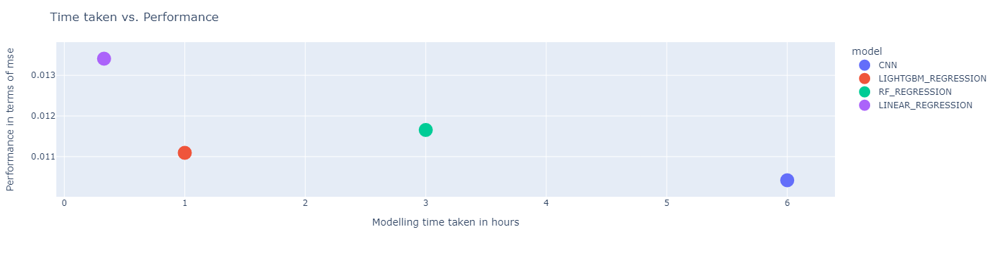

In [88]:
fig = px.scatter(model_scores, x=list([6, 1, 3, 0.33]), y=model_scores.mse*100, color = model_scores.index)
fig.update_traces(marker_size=20)
fig.update_layout(title='Time taken vs. Performance',
                  yaxis_zeroline=False, xaxis_zeroline=False, xaxis_title = "Modelling time taken in hours", yaxis_title = "Performance in terms of mse")
fig.show()

The plot above shows a comparison between model training time and performance measured in MSE. Our best performing model took approximately 6 hours to train. Although it outperformed all of our other models, it does not outperform by a substantial amount for the given data. In contrast, linear regression and LightGBM take considerably less time to model while delivering results that are nearly as good as the TCN. The optimal location in the above plot is the lower left hand corner of the graph because this area indicates the shortest training time and the lowest MSE score.

## Absolute Error Analysis

In [228]:
def create_plotly_df(df, crypto):
    
    '''
    Extract relevant information for the passed in crypto from the complete master table.

    :param df: The dataframe from which a table will be created for easier plotting. 
    :param crypto: String name of the crpyto for which we want the metrics. 
    
    :return: A pandas dataframe which includes time horizon, the forecast, the actual return realizatons, and finally a calculated absolute error for each hour 
             for the respective requested crypto. 
    '''
    
    final_df = pd.DataFrame()
    final_df["test_predictions"] = df["test_predictions"][crypto] 
    time_index = get_time_index(df, crypto)
    final_df.insert(0, "time_frame", time_index[-len(final_df):])
    final_df.insert(1,"crypto", df["crypto"][crypto])
    final_df["test_actual_returns"] = df["test_actual_returns"][crypto]
    final_df["absolute_difference"] = (final_df["test_actual_returns"] -final_df["test_predictions"]).abs()
    
    return final_df

df_final = pd.DataFrame()

for i in tqdm(np.arange(0,len(crypto_list))): 
    df_final = df_final.append(create_plotly_df(cnn, i))
    
def create_scatter_plot(master_table, crypto):
    '''
    Creates a Concatenated plot of forecasts vs. realization and the absolute error across time. 
    
    :param df: The dataframe containing the metric results by a specific model for each crypto. 
    :param crypto: String name of the crpyto for which we want the metrics. 
    
    :return: Concatenated plots composed of the realization/forecast and absolute error across time for the requested crypto.
    '''
    
    df = master_table[master_table["crypto"] == crypto]
    fig = go.Figure()
    fig = make_subplots(rows=1, cols=2, subplot_titles=[crypto+" - Returns", crypto+' - Historical Absolute Error'])
    
    
    fig.add_trace(
    go.Scatter(x=df['time_frame'], y=df['test_actual_returns'], name = "Actual Returns"),
    row=1, col=1)

    fig.add_trace(
        go.Scatter(x=df['time_frame'], y=df['test_predictions'], name = "Predicted Returns"),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=df['time_frame'], y=df['absolute_difference'],  name = "Absolute Error"),
        row=1, col=2
    )
    
    fig['layout']['yaxis1']['title']='Returns'
    fig['layout']['yaxis2']['title']='Absolute Error'
    
    fig.show()

100%|██████████| 10/10 [00:01<00:00,  8.74it/s]


The above left scatterplots display the forecasts and actual returns for each crypto's test data using our TCN model. The above right scatterplots dislay the absolute error of our predictions across the test data set timeframe.

The most accurate forecasts and absolute error graphs were for BTC. We observe that the forecasts follow the true returns quite well, however the forecasts do not capture the full peaks and troughs of the actual test data. The absolute error for BTC is smaller than the absolute error for the other coins. The max absolute error for BTC occurs on December 4th 2021 with a value of approximately 0.069. 

On the other hand, the worst forecasts and absolute error graphs were for ETC. When observing the absolute error graph for ETC, it appears that the absolute errors are consistent throughout time, however there is an extreme peak on September 26th 2022 with an absolute error of approximately 0.25. 

We notice that for each crypto's forecasts, the prediction follows the actual value quite closely. This may be because the margin of error when predicting a crypto's return for a future hour is lower than predicting a crypto's return for a future day, week, or even month. Thus, the model can just weigh recent hours more heavily than past hours to obtain good forecasts.

## Volatility Exploration 

In [93]:
volatility = pd.DataFrame()
pd.set_option("display.precision", 5)

for crypto in crypto_list:
    train, test = ut.get_train_test(crypto)
    volatility = volatility.append(pd.DataFrame({"crypto" : crypto, 
    "training_volatility_%" : round(train["returns"].std()*100,2), 
    "testing_volatility_%" : round(test["returns"].std()*100,2),
    "volatility_difference_%": round(((train["returns"].std()-test["returns"].std())*100),2)}, index = [0]))

In [94]:
volatility.sort_values(by = "volatility_difference_%", inplace = True, ascending = False)
volatility

,crypto,training_volatility_%,testing_volatility_%,volatility_difference_%
0,XLM,22.64,2.28,20.36
0,TRX,7.85,2.05,5.80
0,XRP,3.74,2.34,1.41
0,LTC,3.10,2.38,0.72
0,XMR,3.04,2.40,0.64
0,BTC,2.29,1.74,0.55
0,ADA,3.07,2.53,0.54
0,ETC,3.52,2.99,0.53
0,ETH,2.76,2.24,0.52
0,LINK,3.29,2.81,0.48


The above table displays the standard deviation percentage wise for each crypto for the training and testing data. The 4th column in the table calculates the difference between the volatility scores of training and testing. We performed this analysis because we noticed lower MSE scores for the testing data set than for the validation data set. Prior to creating this table, we assumed that this occurs because there is higher volatility within the training data set than there was in the testing data set. This is now confirmed by observing that every crypto's volatility is higher in the training set than the testing set.

----
# End of Notebook